# Strategy

#### The EMA of two different periods ( fast and slow) over a large data set is always cointegrated. The Z-values of spread between two emas when plotted over a range is mean reverting. to caputre the maximum profit we calculate the slope of z-values over 1 period range. when the slope changes it's direction we close our current postion and open a counter position in the market.

 enter strategy: slope of z-value changes it's direction
 
 closing strategy: slope z-value changes the opposite direction
 
 Stop loss: Strategy is self sufficient for the stop loss as the price move in the opposite direction the slope signal will 
 be negative

In [23]:
""" importing the important libraries:
     Yfianance is used to retrieve the historical data of the CL Futures"""

import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt 
import yfinance as yf
pd.set_option('expand_frame_repr', True) 
%matplotlib inline
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"
pd.set_option('display.max_rows', None)
pd.options.mode.chained_assignment = None

' importing the important libraries:\n     Yfianance is used to retrieve the historical data of the CL Futures'

In [24]:
""" Downloading the data of Crude Oil Futures From Yfinance over a period of 1 month with 30minutes interval"""

# ticker="Cl=F"

# data=yf.download(ticker, start='2023-06-20', end='2023-07-20', interval='30m')

# data.tail()

data=pd.read_csv("MicrosoftData.csv")

' Downloading the data of Crude Oil Futures From Yfinance over a period of 1 month with 30minutes interval'

' Calculating the EMA of the closing price of the data over the period of 9  and 40 '

Text(0.5, 0, 'ema1')

Text(0, 0.5, 'ema2')

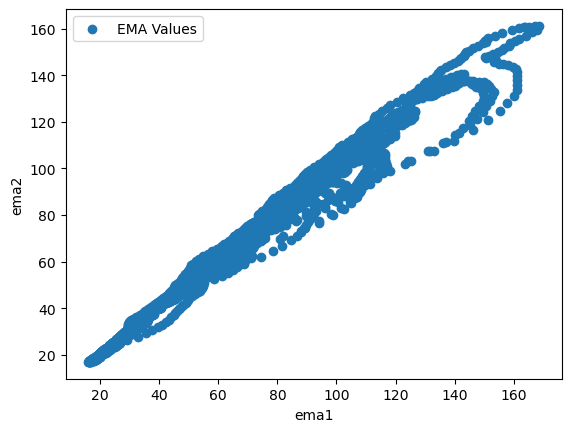

In [25]:
""" Calculating the EMA of the closing price of the data over the period of 9  and 40 """

ema1 = data["Close"].ewm(span=9).mean()
ema2 = data["Close"].ewm(span=25).mean()

plt.scatter(ema1, ema2, label="EMA Values")

plt.xlabel("ema1")
plt.ylabel("ema2")
plt.legend()
plt.show()

"Performing the Linear Regression for both the EMA's to get the residual values \n   to verify the ADF Test for cointegration"

'importing the library for linear regression'

                            OLS Regression Results                            
Dep. Variable:                   ema2   R-squared:                       0.991
Model:                            OLS   Adj. R-squared:                  0.991
Method:                 Least Squares   F-statistic:                 8.376e+05
Date:                Wed, 16 Aug 2023   Prob (F-statistic):               0.00
Time:                        08:20:35   Log-Likelihood:                -19933.
No. Observations:                7807   AIC:                         3.987e+04
Df Residuals:                    7805   BIC:                         3.988e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.9211      0.073     12.639      0.0

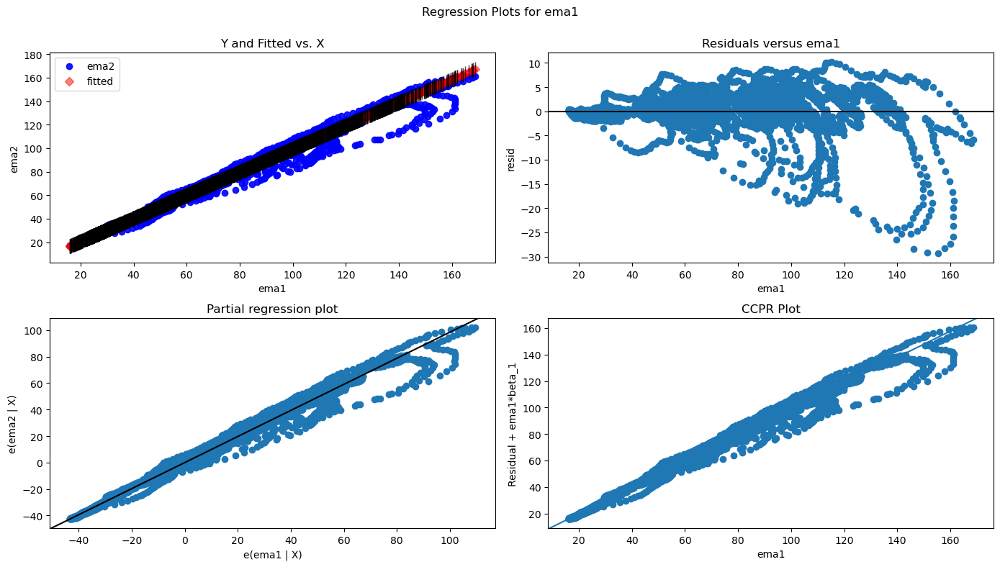

In [26]:
"""Performing the Linear Regression for both the EMA's to get the residual values 
   to verify the ADF Test for cointegration"""


new=pd.DataFrame(ema1) #creating a data frame for linear regression (OLS)
new['ema2']=ema2
new.rename(columns={"Close":"ema1"},inplace=True)
new['const']=1
X=['const','ema2']
Y=[new['ema1']]

"""importing the library for linear regression"""
import statsmodels.api as sm
from statsmodels.formula.api import ols
  
  
#fitting the model 

linear_model = ols("ema2 ~ ema1", data=new).fit()
  
# display model summary
print(linear_model.summary())
  
# modify figure size
fig = plt.figure(figsize=(14, 8))
  
# creating regression plots
fig = sm.graphics.plot_regress_exog(linear_model,
                                    1,
                                    fig=fig)

'getting the residual values and residual plot for the last 100 periods'

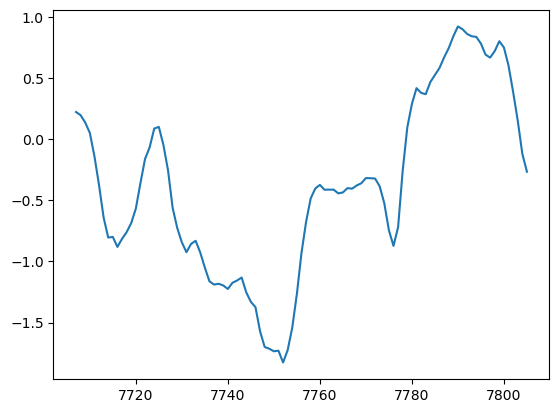

In [27]:
"""getting the residual values and residual plot for the last 100 periods"""

residual_values=linear_model.resid

plt.plot(residual_values[-100:-1])

In [28]:
#performing the ADF test for verification of cointegration

from statsmodels.tsa.stattools import adfuller

ADF_result = adfuller(residual_values)
print('ADF Statistic: %f' % ADF_result[0])
print('p-value: %f' % ADF_result[1])
print('Critical Values:')
for key, value in ADF_result[4].items():
 print('\t%s: %.3f' % (key, value))

ADF Statistic: -16.324666
p-value: 0.000000
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567


In [29]:
linear_model.params[1]

0.9850798731106304

"Creating the spread of two EMA's with normalizing the ema2 with linear_model data"

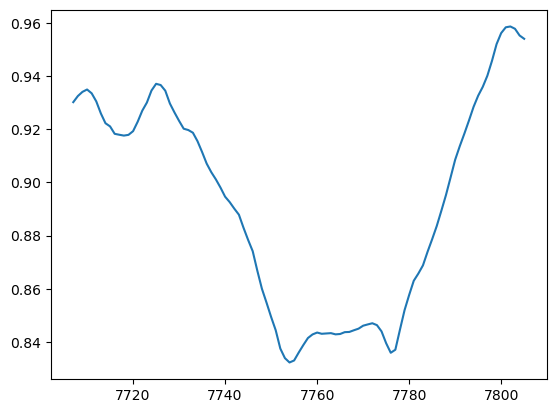

In [30]:
"""Creating the spread of two EMA's with normalizing the ema2 with linear_model data"""
import scipy.stats as stats
import math

spread=ema1-30.3*ema2
z_value=stats.zscore(spread) #calculating the z -scores
plt.plot(z_value[-100:-1])  #plottng 100 period data



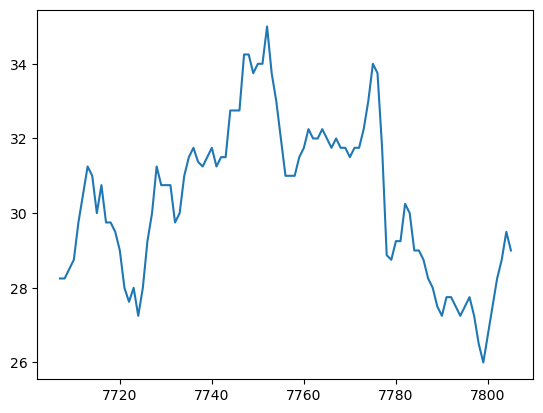

In [31]:
plt.plot(data["Close"][-100:-1])

In [32]:
""" Function has been created to get the slope of z_scores"""


    
def get_slope(y2,x2,y1,x1):
    m=(y2-y1)
    return m
        
slope=[0]
for i in range(1,len(z_value)):
    v=get_slope(z_value[i], i, z_value[i-1], i-1)
    slope.append(v)
   




' Function has been created to get the slope of z_scores'

In [33]:
""" storing the index where the slope changes the direction towards negative and positive"""

positive_slope=[]
negative_slope=[]

for i in range(0,len(slope)):
    
    if( slope[i]<0and i>0 and slope[i-1]>0): 
        negative_slope.append(i)
    
    elif (slope[i]>0and i>0 and slope[i-1]<0):
        positive_slope.append(i)

data["position"]=np.nan
 
  
for i in range(len(data)): 
    
   
    if( i in negative_slope): 
        data["position"].iloc[i]=-1    #sell
    
    elif( i in positive_slope):
        data["position"].iloc[i]=1   #buy
    
    else:
        data["position"].iloc[i]=0   #hold
        
""" looking at data with our positions at each period"""        
data

' storing the index where the slope changes the direction towards negative and positive'

' looking at data with our positions at each period'

,Adj_Close,Close,Date,High,Low,Open,Symbol,Volume,position
0,64.940002,64.940002,2017-03-01,64.989998,64.019997,64.129997,MSFT,26763800,0.0
1,63.980000,63.980000,2017-02-28,64.199997,63.759998,64.080002,MSFT,23043900,0.0
2,64.230003,64.230003,2017-02-27,64.540001,64.050003,64.540001,MSFT,15850400,0.0
3,64.620003,64.620003,2017-02-24,64.800003,64.139999,64.529999,MSFT,21705200,-1.0
4,64.620003,64.620003,2017-02-23,64.730003,64.190002,64.419998,MSFT,20235200,0.0
5,64.360001,64.360001,2017-02-22,64.389999,64.050003,64.330002,MSFT,19259700,1.0
6,64.489998,64.489998,2017-02-21,64.949997,64.449997,64.610001,MSFT,19384900,-1.0
7,64.620003,64.620003,2017-02-17,64.690002,64.300003,64.470001,MSFT,21234600,0.0
8,64.519997,64.519997,2017-02-16,65.239998,64.440002,64.739998,MSFT,20524700,0.0
9,64.529999,64.529999,2017-02-15,64.570000,64.160004,64.500000,MSFT,16917000,0.0


In [34]:
data["z_score"]=z_value
data["slope"]=slope

In [35]:
demo1=[]
demo2=[]
for i in range(0,len(z_value)): 
    if( i in negative_slope): 
        demo1.append(data["Close"].iloc[i])
        demo2.append(np.nan)
    elif( i in positive_slope):
        demo2.append(data["Close"].iloc[i])
        demo1.append(np.nan)
    else:
        demo1.append(np.nan)
        demo2.append(np.nan)


In [36]:
# import plotly.graph_objects as go

# candlestick = go.Candlestick(
#                             data["Timestamp"],
#                         data["Open"],
#                             data["High"],
#                             data["Low"],
#                             data["Close"]
#                             )

# d1 = go.Scatter(x=data.index,
#                  y=demo1, 
#                  mode="markers+text",
#         marker=dict(symbol='triangle-down-open', size = 12)

#                 )
# d2= go.Scatter(x=data.index,
#                  y=demo2, 
#                  mode="markers+text",
#         marker=dict(symbol='triangle-up-open', size = 12)

#                 )
                
# fig = go.Figure(data=[candlestick,d1,d2])

# fig.show()
# fig.write_html(r'C:\Users\shiv.pandey\Downloads\BZ_F.html')

In [37]:
data["buy_entry"]=0
data["buy_exit"]=0
data["sell_entry"]=0
data["sell_exit"]=0
data["holding_period"]=0
data["pnl"]=0

In [44]:
#calculating the PnL for our postions 

""" we are having alternate trade signals. so if we are buy then at sell signal we just need to subtract the last price 
traded from the current price for PnL"""
test=False
p=0
last_postion=0
no_trades=0
p_l=[0]
last_trade=0
s_l=False
count=0
for index,rows in data.iterrows(): 
    if(rows["position"]==0 and s_l==False):
        if last_trade==-1:
            if p-rows["Low"]<-0.003*p:
                data["pnl"].iloc[count]=-0.0025*p
                data["position"].iloc[count]="SELL_STOP"
                no_trades+=1
                s_l=True
                data["sell_exit"].iloc[count]=rows["Close"]
        elif last_trade==1: 
            if rows["Low"]-p<-0.003*p:
                data["pnl"].iloc[count]=-0.0025*p
                data["position"].iloc[count]="Buy_Stop"
                no_trades+=1
                s_l=True
                data["buy_exit"].iloc[count]=rows["Close"]
        else:
            data["pnl"].iloc[count]=0
    elif(rows["position"]==-1 and test==False):
        data["sell_entry"].iloc[count]=rows["Close"]
        no_trades+=1
        p=rows["Close"]
        test=True
        
    elif(rows["position"]==1 and test==False):
        data["buy_entry"].iloc[count]=rows["Close"]
        
        no_trades+=1
        p=rows["Close"]
        
        test=True #keeping test as true after entering in the market 
        
    elif(rows["position"]==-1 and test==True):
        if s_l==False:
             
             data["pnl"].iloc[count]=rows["Close"]-p
             no_trades+=1
             data["buy_exit"].iloc[count]=rows["Close"]
        data["sell_entry"].iloc[count]=rows["Close"]
        p=rows["Close"]
        s_l=False
        last_trade=-1
        
          
    elif(rows["position"]==1 and test==True):   
        if s_l==False:
             no_trades+=1
             data["pnl"].iloc[count]=p-rows["Close"]
             data["sell_exit"].iloc[count]=rows["Close"]
        data["buy_entry"].iloc[count]=rows["Close"]
            
        last_trade=1
        p=rows["Close"]
        s_l=False
    count+=1
# position=data["position"][data["position"]!=0]            #for last position
# last_position=position[-1]


' we are having alternate trade signals. so if we are buy then at sell signal we just need to subtract the last price \ntraded from the current price for PnL'

In [45]:
# data

In [46]:

""" modifying the last position"""
if (no_trades%2==0):
    last_position=0


""" getting the holding period """
data["holding_period"]=0
count=0
last_holding_period=0
test=False
for index,rows in data.iterrows():
    if count>=1:
        if rows["buy_entry"]>0 or rows["sell_entry"]>0:
            data["holding_period"]=data.index[count]-data.index[count]
            test=True
        elif test==True: 
            data["holding_period"].iloc[count]=data["holding_period"].iloc[count-1]+ (data.index[count]-data.index[count-1])
    count+=1
        

' modifying the last position'

' getting the holding period '

In [47]:
""" getting the final values """

""" getting the no. of profit,loss trades and total profit and loss"""
profit_trades=0
loss_trades=0
profit=0
loss=0
for i in range(len(data)):
    if(data["pnl"].iloc[i]>0 and (data["sell_exit"].iloc[i]>0 or data["buy_exit"].iloc[i]>0)):
        profit_trades+=1
        profit+=data["pnl"].iloc[i]
    elif(data["pnl"].iloc[i]<0 and (data["sell_exit"].iloc[i]>0 or data["buy_exit"].iloc[i]>0)):
        profit_trades+=1
        loss_trades+=1
        loss+=data["pnl"].iloc[i]

""" getting the the maximum holding period for any position"""        
        
def max_hl(x,y):
     if x>y:
            return x
     else: 
        return y

for i in range(1,len(data)): 
    t=max_hl(data["holding_period"].iloc[i],data["holding_period"].iloc[i-1])    
    
    
""" getting the Finals Values """
    
final={
       "total Profitable Trades": profit_trades,
       "total Loss Trades": loss_trades,
        "Profit": profit,
        "loss": loss,
         "net Profit": sum(data["pnl"]),
         "open position": last_position,
         "maximum holding period": t,
          "Transaction Cost": no_trades*1.75,
             "tick size": 0.0001,
           " Net dollar Profit": sum(data["pnl"])*100 - no_trades*1.75,
           "Total Time Period": data.index[-1]-data.index[0]
       
      }

' getting the final values '

' getting the no. of profit,loss trades and total profit and loss'

' getting the the maximum holding period for any position'

' getting the Finals Values '

In [48]:

data



,Adj_Close,Close,Date,High,Low,Open,Symbol,Volume,position,z_score,slope,buy_entry,buy_exit,sell_entry,sell_exit,holding_period,pnl
0,64.940002,64.940002,2017-03-01,64.989998,64.019997,64.129997,MSFT,26763800,0.0,-0.173545,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0,0.000000
1,63.980000,63.980000,2017-02-28,64.199997,63.759998,64.080002,MSFT,23043900,0.0,-0.158150,1.539530e-02,0.000000,0.000000,0.000000,0.000000,0,0.000000
2,64.230003,64.230003,2017-02-27,64.540001,64.050003,64.540001,MSFT,15850400,0.0,-0.155798,2.351802e-03,0.000000,0.000000,0.000000,0.000000,0,0.000000
3,64.620003,64.620003,2017-02-24,64.800003,64.139999,64.529999,MSFT,21705200,-1.0,-0.157986,-2.188023e-03,0.000000,0.000000,64.620003,0.000000,0,0.000000
4,64.620003,64.620003,2017-02-23,64.730003,64.190002,64.419998,MSFT,20235200,0.0,-0.159295,-1.308941e-03,0.000000,0.000000,0.000000,0.000000,0,0.000000
5,64.360001,64.360001,2017-02-22,64.389999,64.050003,64.330002,MSFT,19259700,1.0,-0.158562,7.327115e-04,64.360001,0.000000,0.000000,64.360001,0,0.260002
6,64.489998,64.489998,2017-02-21,64.949997,64.449997,64.610001,MSFT,19384900,-1.0,-0.158752,-1.893956e-04,0.000000,64.489998,64.489998,0.000000,0,0.129997
7,64.620003,64.620003,2017-02-17,64.690002,64.300003,64.470001,MSFT,21234600,0.0,-0.159536,-7.844047e-04,0.000000,0.000000,0.000000,0.000000,0,0.000000
8,64.519997,64.519997,2017-02-16,65.239998,64.440002,64.739998,MSFT,20524700,0.0,-0.159688,-1.519902e-04,0.000000,0.000000,0.000000,0.000000,0,0.000000
9,64.529999,64.529999,2017-02-15,64.570000,64.160004,64.500000,MSFT,16917000,0.0,-0.159851,-1.629484e-04,0.000000,0.000000,0.000000,0.000000,0,0.000000


In [49]:
final

{'total Profitable Trades': 1476,
 'total Loss Trades': 913,
 'Profit': 996.055916,
 'loss': -134.82698960500008,
 'net Profit': 861.2289263950015,
 'open position': 0,
 'maximum holding period': 0,
 'Transaction Cost': 1645.0,
 'tick size': 0.0001,
 ' Net dollar Profit': 84477.89263950015,
 'Total Time Period': 7806}

' calculation the net profit curve over the period '

Text(0.5, 1.0, ' Net Profit ')

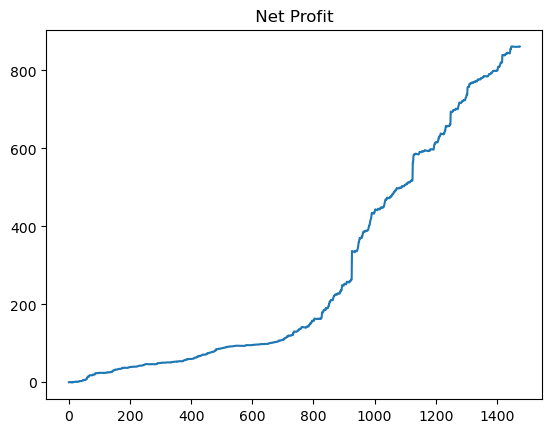

In [50]:
""" calculation the net profit curve over the period """
aggr_p=0
PL=[]
count=0
for i in range(len(data)):
    if data["pnl"].iloc[i]!=0:
        aggr_p=aggr_p+data["pnl"].iloc[i]
        PL.append(aggr_p)
    count+=1
plt.plot(PL)
plt.title(" Net Profit ")


In [51]:
data["pnl"]

0        0.000000
1        0.000000
2        0.000000
3        0.000000
4        0.000000
5        0.260002
6        0.129997
7        0.000000
8        0.000000
9        0.000000
10       0.000000
11      -0.161225
12       0.489998
13      -0.160000
14      -0.160000
15       0.000000
16       0.000000
17       0.000000
18       0.000000
19       0.000000
20       0.000000
21      -0.161625
22      -0.161625
23       0.000000
24      -0.160675
25      -0.160675
26       0.000000
27       0.000000
28       0.000000
29       0.000000
30       0.000000
31       0.000000
32       0.000000
33       0.000000
34       0.000000
35       0.000000
36       0.000000
37       0.000000
38       0.000000
39       0.000000
40       0.000000
41       0.000000
42       0.000000
43       0.000000
44       0.000000
45      -0.158200
46       0.000000
47       0.000000
48       0.000000
49       0.980000
50       0.000000
51       0.000000
52       0.000000
53      -0.155750
54      -0.155750
55       0

In [52]:
x=(data["pnl"][data["pnl"]<0])

In [945]:
for i in range(len(x)): 
    if x.iloc[i]<-0.00045*data["Close"].mean():
        x.iloc[i]=-0.00045*data["Close"].mean()

In [946]:
y=data["pnl"][data["pnl"]>0]

In [934]:
y.mean()

0.23900041580200196

In [935]:
x

Datetime
2023-06-20 08:00:00   -0.026671
2023-06-20 08:30:00   -0.026671
2023-06-21 03:30:00   -0.026671
2023-06-22 05:00:00   -0.026671
2023-06-23 14:00:00   -0.026671
2023-06-26 02:30:00   -0.026671
2023-06-26 04:00:00   -0.026671
2023-06-26 09:00:00   -0.026671
2023-06-26 12:30:00   -0.026671
2023-06-27 05:30:00   -0.026671
2023-06-27 11:00:00   -0.026671
2023-06-28 04:00:00   -0.026671
2023-06-28 08:00:00   -0.026671
2023-06-28 11:00:00   -0.026671
2023-06-29 04:30:00   -0.026671
2023-06-29 12:30:00   -0.026671
2023-06-29 23:00:00   -0.026671
2023-06-30 04:30:00   -0.026671
2023-06-30 11:30:00   -0.026671
2023-07-02 22:00:00   -0.026671
2023-07-03 10:30:00   -0.026671
2023-07-05 05:00:00   -0.026671
2023-07-06 07:00:00   -0.026671
2023-07-06 09:30:00   -0.026671
2023-07-06 14:30:00   -0.026671
2023-07-07 09:00:00   -0.026671
2023-07-07 10:30:00   -0.026671
2023-07-10 09:30:00   -0.026671
2023-07-10 13:00:00   -0.026671
2023-07-11 09:00:00   -0.026671
2023-07-12 08:00:00   -0.026671

In [854]:
data["Close"].describe()

count    709.000000
mean      58.147320
std        2.755126
min       51.700001
25%       55.740002
50%       59.139999
75%       60.610001
max       61.980000
Name: Close, dtype: float64

In [855]:
sum(x)

-0.7588225280823592